In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator


In [2]:
# setting the path and the labels list for classification of targets on the basis in human understandable form

train_dir = os.path.join('/content/drive/MyDrive/archive/Garbage classification/Garbage classification')
labels = ['cardboard', 'glass', 'metal', 'paper', 'plastic', 'trash']

In [3]:
# checking the size of data available to us for training out model

for label in labels:
    directory = os.path.join(train_dir, label)
    print("Images of label \"" + label + "\":\t", len(os.listdir(directory)))

Images of label "cardboard":	 403
Images of label "glass":	 521
Images of label "metal":	 410
Images of label "paper":	 594
Images of label "plastic":	 482
Images of label "trash":	 137


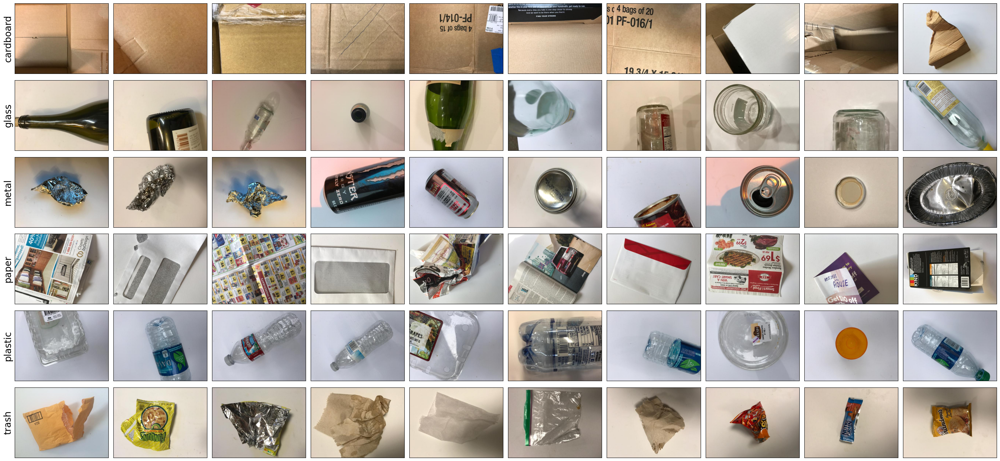

In [4]:
# plotting images of different review for understanding the dataset

plt.figure(figsize=(30,14))

for i in range(6):
    directory = os.path.join(train_dir, labels[i])
    for j in range(10):
        path = os.path.join(directory, os.listdir(directory)[j])
        img = mpimg.imread(path)

        plt.subplot(6, 10, i*10 + j + 1)
        plt.imshow(img)

        if j == 0:
            plt.ylabel(labels[i], fontsize=20)

plt.setp(plt.gcf().get_axes(), xticks=[], yticks=[]);
plt.tight_layout()
plt.show()


In [5]:

# checking size of individual image

directory = os.path.join(train_dir, 'cardboard')
path = os.path.join(directory, os.listdir(directory)[0])
image = mpimg.imread(path)
image.shape

(384, 512, 3)

**DEEP LEARNING**

In [6]:

  # creating the model

model = tf.keras.Sequential([
  tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(384, 512, 3)),
  tf.keras.layers.BatchNormalization(),
  tf.keras.layers.Conv2D(32, (3, 3), activation='relu'),
  tf.keras.layers.BatchNormalization(),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Dropout(0.2),

  tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
  tf.keras.layers.BatchNormalization(),
  tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
  tf.keras.layers.BatchNormalization(),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
  tf.keras.layers.BatchNormalization(),
  tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
  tf.keras.layers.BatchNormalization(),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Dropout(0.2),

  tf.keras.layers.Conv2D(256, (3, 3), activation='relu'),
  tf.keras.layers.BatchNormalization(),
  tf.keras.layers.Conv2D(256, (3, 3), activation='relu'),
  tf.keras.layers.BatchNormalization(),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Dropout(0.2),

  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(512, activation='relu'),
  tf.keras.layers.BatchNormalization(),
  tf.keras.layers.Dropout(0.4),
  tf.keras.layers.Dense(6, activation='softmax')
])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 382, 510, 32)      896       
                                                                 
 batch_normalization (BatchN  (None, 382, 510, 32)     128       
 ormalization)                                                   
                                                                 
 conv2d_1 (Conv2D)           (None, 380, 508, 32)      9248      
                                                                 
 batch_normalization_1 (Batc  (None, 380, 508, 32)     128       
 hNormalization)                                                 
                                                                 
 max_pooling2d (MaxPooling2D  (None, 190, 254, 32)     0         
 )                                                               
                                                        

In [7]:
model.compile(loss='sparse_categorical_crossentropy', optimizer=keras.optimizers.Adam(learning_rate = 0.0001), metrics=['accuracy'])

In [8]:
# creating generators for combining data and increasing the gainable insights by slightly modifying the images in the dataset

train_datagen = ImageDataGenerator(horizontal_flip=True,vertical_flip=True,
                                   rotation_range=15,zoom_range=0.1,
                                   width_shift_range=0.15,height_shift_range=0.15,
                                   shear_range=0.1,
                                   fill_mode="nearest",
                                   rescale=1./255.,
                                   validation_split=0.2)

train_generator = train_datagen.flow_from_directory(train_dir, target_size=(384, 512), batch_size=32, class_mode='binary', subset='training')
validation_generator = train_datagen.flow_from_directory(train_dir, target_size=(384, 512), batch_size=32, class_mode='binary', subset='validation')

Found 2040 images belonging to 6 classes.
Found 507 images belonging to 6 classes.


In [9]:
# creating the callback function so that it can be used to end the training in case reached a good accuracy rate (above 90%)

class myCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs={}):
        if(logs.get('accuracy')>0.90):
            print("\nReached 90% accuracy so cancelling training!")
            self.model.stop_training = True

callbacks = myCallback()


In [1]:
history = model.fit(train_generator, epochs=50, verbose=1, validation_data=validation_generator, callbacks=[callbacks])

NameError: ignored

Enter any category by index: 0
Enter any index to test: 1
1/1 [==============================] - 0s 499ms/step


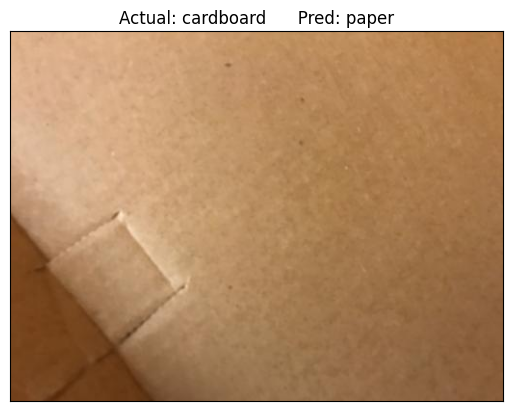

In [14]:
cat = int(input('Enter any category by index: '))
ind = int(input('Enter any index to test: '))

directory = os.path.join(train_dir, labels[cat % 6])
try:
    path = os.path.join(directory, os.listdir(directory)[ind])
    img = mpimg.imread(path)
    x = keras.preprocessing.image.img_to_array(img)
    x = np.expand_dims(x, axis=0)

    images = np.vstack([x])
    classes = model.predict(images)
    pred = labels[np.argmax(classes)]

    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
    plt.title('Actual: {}      Pred: {}'.format(labels[cat], pred))

except:
    print('Invalid Value')

**Pytorch Garbage Classification**

In [15]:
import os
import torch
import torchvision
from torch.utils.data import random_split
import torchvision.models as models
import torch.nn as nn
import torch.nn.functional as F

In [17]:
data_dir  = '/content/drive/MyDrive/archive/Garbage classification/Garbage classification'

classes = os.listdir(data_dir)
print(classes)

['.DS_Store', 'plastic', 'trash', 'glass', 'cardboard', 'paper', 'metal']


In [18]:
from torchvision.datasets import ImageFolder
import torchvision.transforms as transforms

transformations = transforms.Compose([transforms.Resize((256, 256)), transforms.ToTensor()])

dataset = ImageFolder(data_dir, transform = transformations)

**Transformations:**

In [19]:
#Now, let's apply transformations to the dataset and import it for use

from torchvision.datasets import ImageFolder
import torchvision.transforms as transforms

transformations = transforms.Compose([transforms.Resize((256, 256)), transforms.ToTensor()])

dataset = ImageFolder(data_dir, transform = transformations)

In [20]:
#Let's create a helper function to see the image and its corresponding label:

import matplotlib.pyplot as plt
%matplotlib inline

def show_sample(img, label):
    print("Label:", dataset.classes[label], "(Class No: "+ str(label) + ")")
    plt.imshow(img.permute(1, 2, 0))

Label: cardboard (Class No: 0)


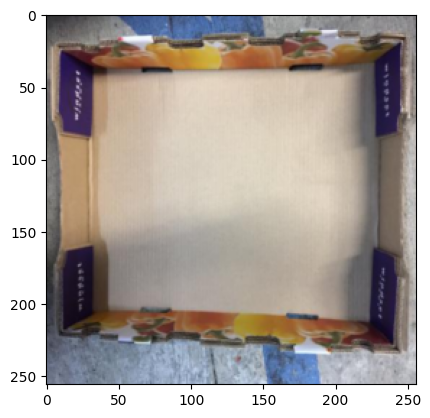

In [22]:
img, label = dataset[22]
show_sample(img, label)

**MODEL BASE**

In [69]:
def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))

class ImageClassificationBase(nn.Module):
    def training_step(self, batch):
        images, labels = batch
        out = self(images)                  # Generate predictions
        loss = F.cross_entropy(out, labels) # Calculate loss
        return loss

    def validation_step(self, batch):
        images, labels = batch
        out = self(images)                    # Generate predictions
        loss = F.cross_entropy(out, labels)   # Calculate loss
        acc = accuracy(out, labels)           # Calculate accuracy
        return {'val_loss': loss.detach(), 'val_acc': acc}

    def validation_epoch_end(self, outputs):
        batch_losses = [x['val_loss'] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()   # Combine losses
        batch_accs = [x['val_acc'] for x in outputs]
        epoch_acc = torch.stack(batch_accs).mean()      # Combine accuracies
        return {'val_loss': epoch_loss.item(), 'val_acc': epoch_acc.item()}

    def epoch_end(self, epoch, result):
        print("Epoch {}: train_loss: {:.4f}, val_loss: {:.4f}, val_acc: {:.4f}".format(
            epoch+1, result['train_loss'], result['val_loss'], result['val_acc']))


In [73]:
#We'll be using ResNet50 for classifying images:

class ResNet(ImageClassificationBase):
    def __init__(self):
        super().__init__()
        # Use a pretrained model
        self.network = models.resnet50(pretrained=True)
        # Replace last layer
        num_ftrs = self.network.fc.in_features
        self.network.fc = nn.Linear(num_ftrs, len(dataset.classes))

    def forward(self, xb):
        return torch.sigmoid(self.network(xb))

model = ResNet()

In [74]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')

def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

**GPU**

In [101]:
# https://pypi.python.org/pypi/pydot
!apt-get -qq install -y graphviz && pip install pydot
import pydot

In [102]:
!pip install cartopy
import cartopy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 19.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.5/46.5 kB 4.1 MB/s eta 0:00:00
  Created wheel for cartopy: filename=Cartopy-0.21.1-cp310-cp310-linux_x86_64.whl size=11080582 sha256=2f598b8da8b4bd56f4d85fef1009409ef2497570542805480c0e7b99ce8d7087
  Stored in directory: /root/.cache/pip/wheels/30/b0/1a/1c1909e00c76653dc4e2ff48555257c0eb2d1698280c8d9955
Successfully built cartopy


Exception in thread QueueFeederThread:
Traceback (most recent call last):
  File "/usr/lib/python3.10/multiprocessing/queues.py", line 239, in _feed
    reader_close()
  File "/usr/lib/python3.10/multiprocessing/connection.py", line 177, in close
    self._close()
  File "/usr/lib/python3.10/multiprocessing/connection.py", line 361, in _close
    _close(self._handle)
OSError: [Errno 9] Bad file descriptor

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/lib/python3.10/threading.py", line 1016, in _bootstrap_inner
    self.run()
  File "/usr/lib/python3.10/threading.py", line 953, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/lib/python3.10/multiprocessing/queues.py", line 271, in _feed
    queue_sem.release()
ValueError: semaphore or lock released too many times
Exception in thread QueueFeederThread:
Traceback (most recent call last):
  File "/usr/lib/python3.10/multiprocessing/queues.py", line 239

In [107]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.utils import load_img
from tensorflow.keras.utils import img_to_array
from tensorflow.keras.utils import array_to_img
from keras.preprocessing.image import ImageDataGenerator
from keras.layers import Conv2D, Flatten, MaxPooling2D, Dense
from keras.models import Sequential

import glob, os, random

In [109]:
base_path = '/content/drive/MyDrive/archive/Garbage classification/Garbage classification'

img_list = glob.glob(os.path.join(base_path, '*/*.jpg'))

print(len(img_list))

2547


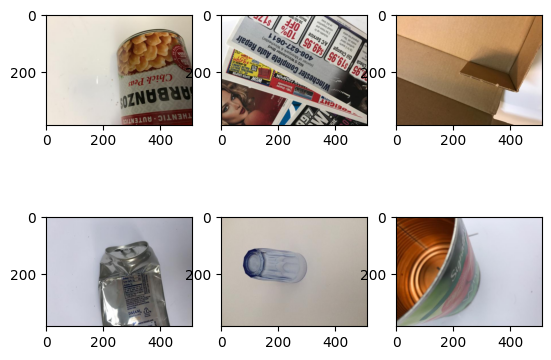

In [110]:
for i, img_path in enumerate(random.sample(img_list, 6)):
    img = load_img(img_path)
    img = img_to_array(img, dtype=np.uint8)

    plt.subplot(2, 3, i+1)
    plt.imshow(img.squeeze())

In [111]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.1,
    zoom_range=0.1,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    vertical_flip=True,
    validation_split=0.1
)

test_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.1
)

train_generator = train_datagen.flow_from_directory(
    base_path,
    target_size=(300, 300),
    batch_size=16,
    class_mode='categorical',
    subset='training',
      seed=0
)

validation_generator = test_datagen.flow_from_directory(
    base_path,
    target_size=(300, 300),
    batch_size=16,
    class_mode='categorical',
    subset='validation',
    seed=0
)

labels = (train_generator.class_indices)
labels = dict((v,k) for k,v in labels.items())

print(labels)

Found 2294 images belonging to 6 classes.
Found 253 images belonging to 6 classes.
{0: 'cardboard', 1: 'glass', 2: 'metal', 3: 'paper', 4: 'plastic', 5: 'trash'}


In [112]:
model = Sequential([
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu', input_shape=(300, 300, 3)),
    MaxPooling2D(pool_size=2),

    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(pool_size=2),

    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(pool_size=2),

    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(pool_size=2),

    Flatten(),

    Dense(64, activation='relu'),

    Dense(6, activation='softmax')
])

model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['acc'])

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 300, 300, 32)      896       
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 150, 150, 32)     0         
 2D)                                                             
                                                                 
 conv2d_9 (Conv2D)           (None, 150, 150, 64)      18496     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 75, 75, 64)       0         
 2D)                                                             
                                                                 
 conv2d_10 (Conv2D)          (None, 75, 75, 32)        18464     
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 37, 37, 32)      

In [113]:
model.fit_generator(train_generator, epochs=20, validation_data=validation_generator)

<ipython-input-113-4ab184f2d620>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  model.fit_generator(train_generator, epochs=20, validation_data=validation_generator)


Epoch 1/20
 13/144 [=>............................] - ETA: 8:29 - loss: 1.7358 - acc: 0.2356

KeyboardInterrupt: ignored

1/1 [==============================] - 3s 3s/step


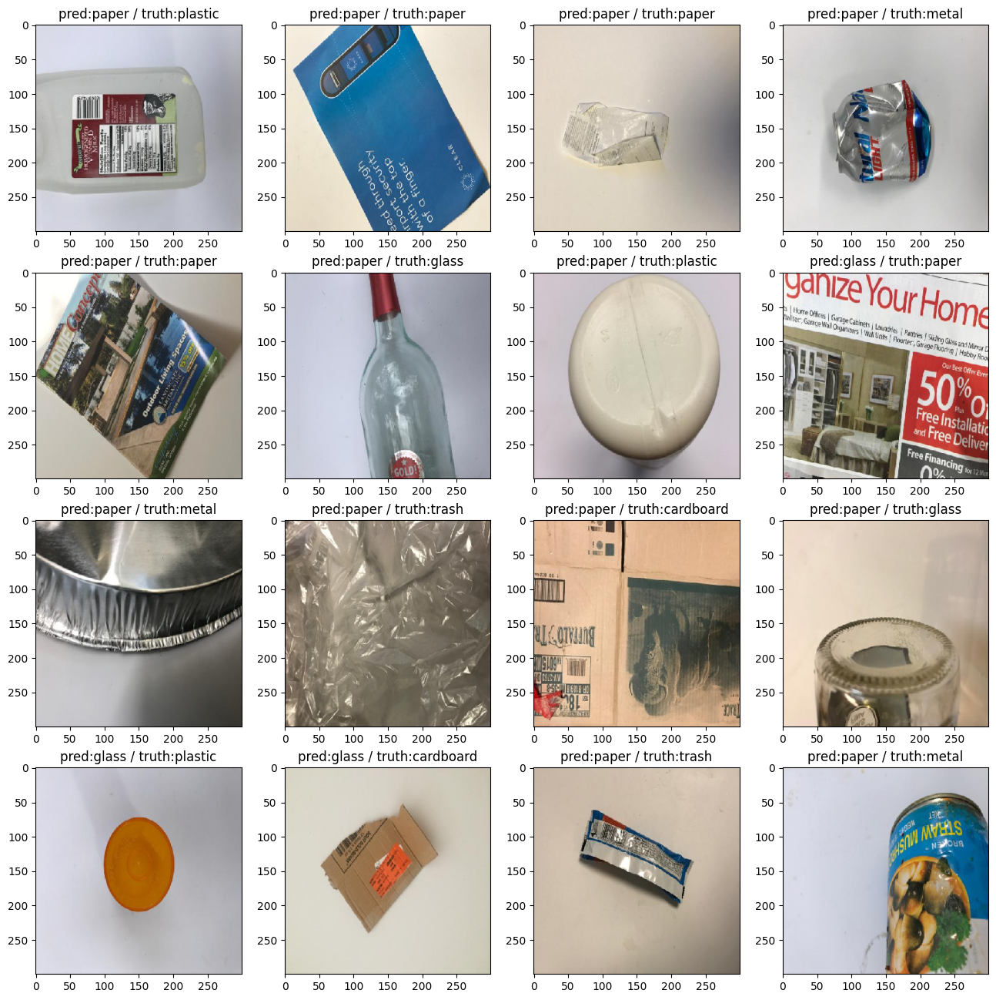

In [114]:
test_x, test_y = validation_generator.__getitem__(1)

preds = model.predict(test_x)

plt.figure(figsize=(16, 16))
for i in range(16):
    plt.subplot(4, 4, i+1)
    plt.title('pred:%s / truth:%s' % (labels[np.argmax(preds[i])], labels[np.argmax(test_y[i])]))
    plt.imshow(test_x[i])


In [117]:
#import numpy for number array handling and represent rgb image pixel values
import numpy as np

#import tensorflow to use any tools needed for deep learning
import tensorflow as tf

#import keras api needed to implement deep learning techiquesX
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation, Dense, BatchNormalization, Conv2D, MaxPool2D, GlobalAveragePooling2D, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator

#import libraries for visualization of data
import matplotlib.pyplot as plt

#Allow charts and graphics to display right below the page of browser setup
%matplotlib inline
#paths to the train, validation and test image datasets
train_path = '/content/drive/MyDrive/archive/Garbage classification/Garbage classification'
valid_path = '/content/drive/MyDrive/archive/Garbage classification/Garbage classification'



In [118]:

# extract images to training set by applying data preprocessing and data augmentation
train_batches = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.vgg19.preprocess_input,
    shear_range=0.2,
    zoom_range=0.2,
    width_shift_range=0.2,
    height_shift_range=0.2,
    validation_split=0.1).flow_from_directory(
    directory=train_path, target_size=(224,224), classes=['cardboard', 'glass', 'metal',
                                                         'paper', 'plastic', 'trash'], batch_size=16, subset='training')




Found 2294 images belonging to 6 classes.


In [119]:
# extract images to validation set
valid_batches = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.vgg19.preprocess_input,
    validation_split=0.1).flow_from_directory(
    directory=valid_path, target_size=(224,224), classes=['cardboard', 'glass', 'metal',
                                                         'paper', 'plastic', 'trash'], batch_size=16, subset='validation')
IMG_SIZE = 224
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)



Found 253 images belonging to 6 classes.


In [120]:
# import the convolution base of the VGG16 model with pre-trained weights
base_model = tf.keras.applications.VGG19(input_shape=IMG_SHAPE,
                                        include_top=False,
                                        weights='imagenet')
model = Sequential()


In [121]:

# Freeze the convolutional base of VGG16 to prevent the pre-trained weights being updated
# during training inorder to extract features
base_model.trainable=False



In [128]:
# add densely-connected NN layer with 128 hidden units
model.add(Dense(units=128, activation='relu')) # use ReLU activation function
model.add(BatchNormalization())                # normalize and scale inputs or activations
model.add(Dropout(0.2))                        # applies dopout to the input which will randomly disable 20% of hidden units



**ANOTHER WAY OF CLASSIFICATION**

In [143]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/content/drive/MyDrive/archive/Garbage classification/Garbage classification'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


/content/drive/MyDrive/archive/Garbage classification/Garbage classification/.DS_Store
/content/drive/MyDrive/archive/Garbage classification/Garbage classification/plastic/plastic253.jpg
/content/drive/MyDrive/archive/Garbage classification/Garbage classification/plastic/plastic288.jpg
/content/drive/MyDrive/archive/Garbage classification/Garbage classification/plastic/plastic227.jpg
/content/drive/MyDrive/archive/Garbage classification/Garbage classification/plastic/plastic425.jpg
/content/drive/MyDrive/archive/Garbage classification/Garbage classification/plastic/plastic352.jpg
/content/drive/MyDrive/archive/Garbage classification/Garbage classification/plastic/plastic116.jpg
/content/drive/MyDrive/archive/Garbage classification/Garbage classification/plastic/plastic411.jpg
/content/drive/MyDrive/archive/Garbage classification/Garbage classification/plastic/plastic322.jpg
/content/drive/MyDrive/archive/Garbage classification/Garbage classification/plastic/plastic102.jpg
/content/driv

In [144]:
# Importing  libraries to be used for dealing with arrays, plotting graphs and displaying images
import tensorflow as tf
import tensorflow.keras as keras
import os
import cv2
import random
import numpy  as np
import pandas as pd
from sklearn.model_selection import train_test_split
import seaborn as sns
import matplotlib.pyplot as plt

In [145]:
# Listing out the categories of the images present in the dataset
data_path =  "/content/drive/MyDrive/archive/Garbage classification/Garbage classification"
print("The categories of garbage in the dataset")
print(os.listdir(data_path))

The categories of garbage in the dataset
['.DS_Store', 'plastic', 'trash', 'glass', 'cardboard', 'paper', 'metal']


In [147]:
data_path2 = "/content/drive/MyDrive/archive/Garbage classification/Garbage classification"
print(os.listdir(data_path2))

['.DS_Store', 'plastic', 'trash', 'glass', 'cardboard', 'paper', 'metal']


In [148]:
def plot_images(item_dir):
    all_item_dirs = os.listdir(item_dir)
    item_files = [os.path.join(item_dir, file) for file in all_item_dirs][:20]
    """
    all_images = os.listdir(images_dir)
    images = [os.path.join(images_dir, image) for image in all_images][:5]
    """
    plt.figure(figsize=(20,20))
    for image_id, image_path in enumerate(item_files):
        plt.subplot(5, 5, image_id+1)
        img = plt.imread(image_path)
        #plt.tight_layout()
        plt.imshow(img, cmap='inferno')

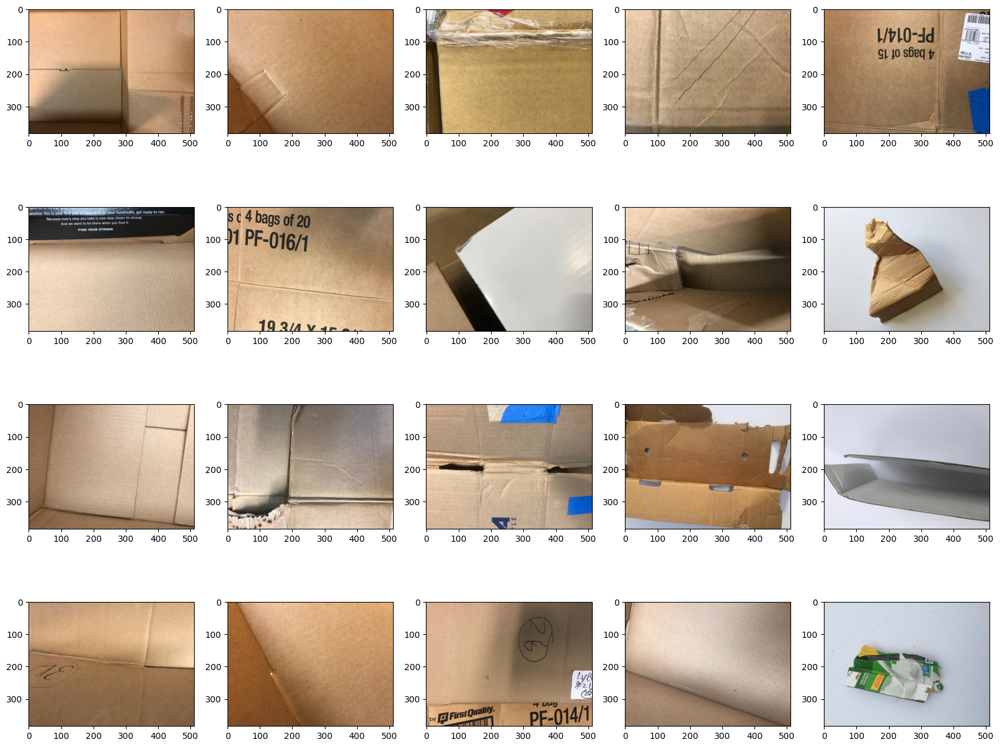

In [149]:
plot_images(data_path+"/cardboard")

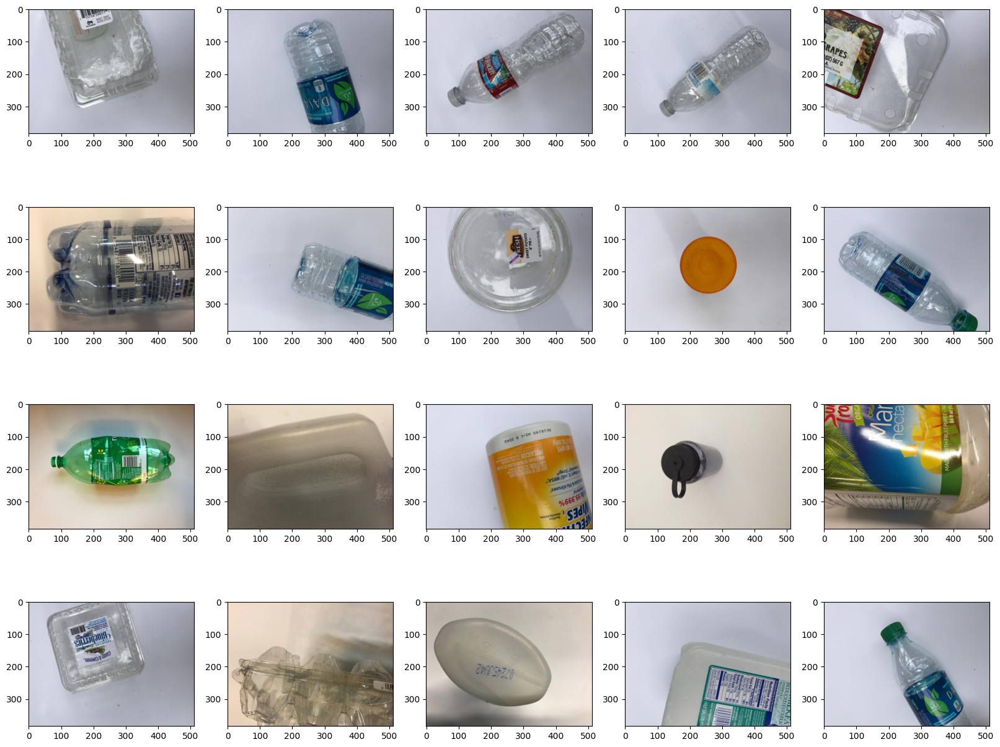

In [150]:
plot_images(data_path2+"/plastic")

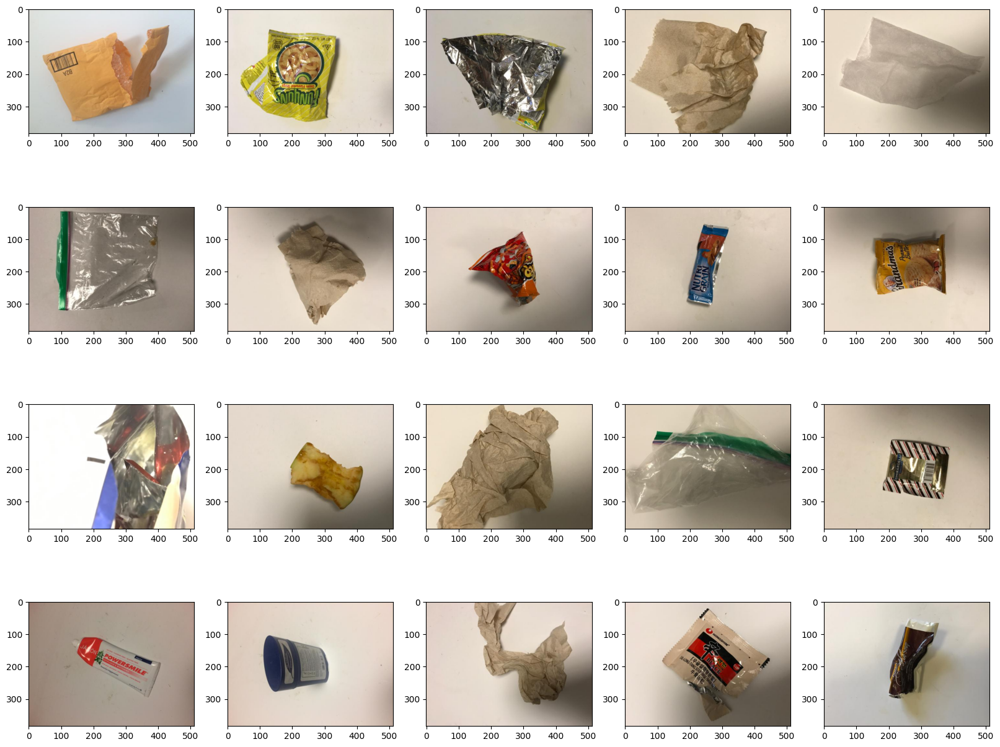

In [151]:
plot_images(data_path2+"/trash")

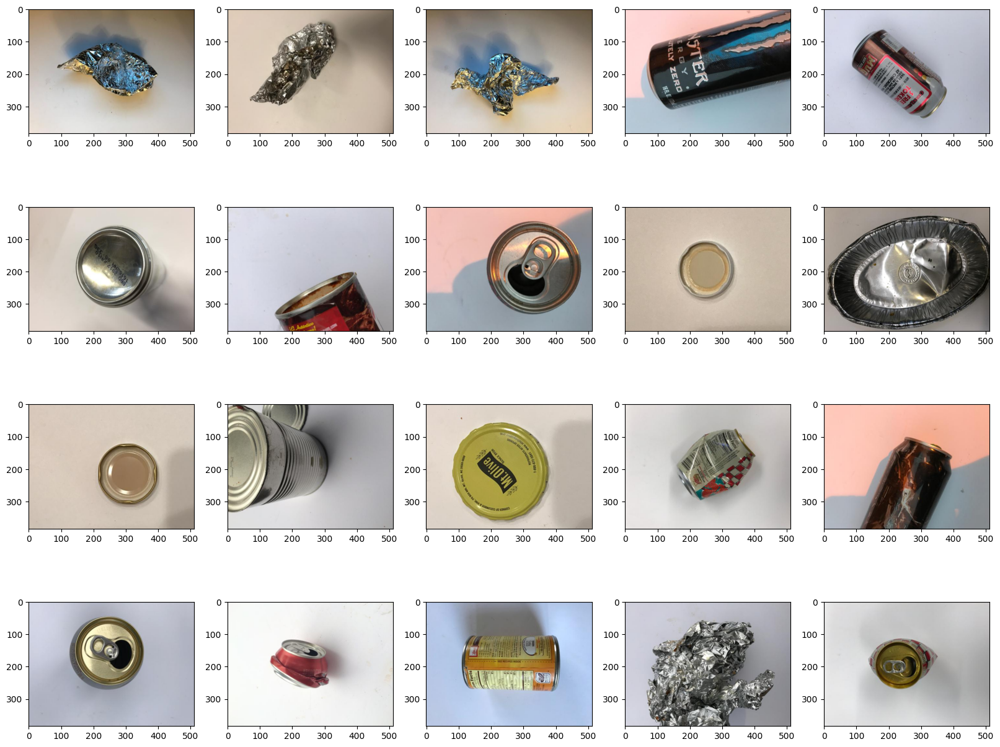

In [152]:
plot_images(data_path2+"/metal")

In [153]:
def freq_plot(items):
    ans = []
    for item_dir in items:
        all_item_dirs = os.listdir(item_dir)
        item_files = [os.path.join(item_dir, file) for file in all_item_dirs]
        ans.append(len(item_files))
    return ans

In [154]:
# Plot of number of samples under each category
# dataset 2
items = [data_path2+"/cardboard",data_path2+"/glass",data_path2+"/metal",data_path2+"/paper",data_path2+"/plastic",data_path2+"/trash"]
categories = ["cardboard","glass","metal","paper","plastic","trash"]
items2 = [data_path+"/cardboard",data_path+"/glass",data_path+"/metal",data_path+"/paper",data_path+"/plastic",data_path+"/trash"]
categories2 = ["cardboard","glass","metal","paper","plastic","trash"]

Text(0, 0.5, 'Frequency of images')

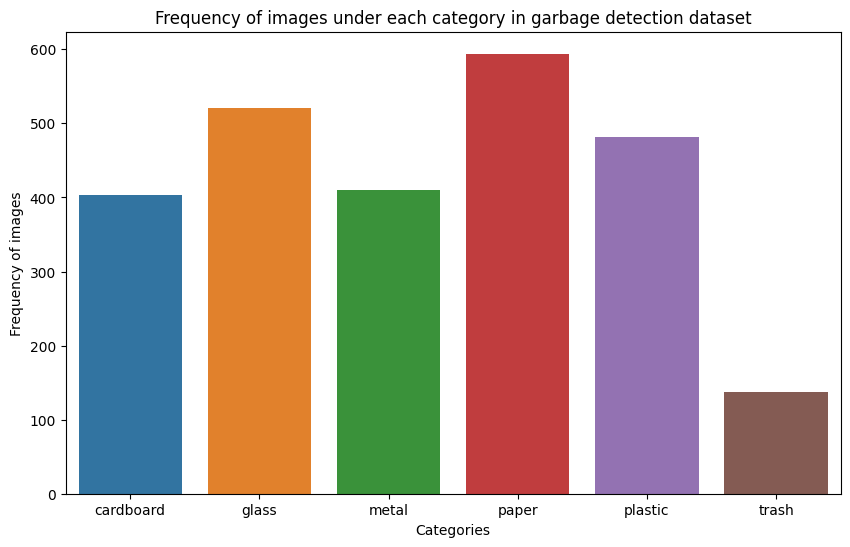

In [155]:
ans = freq_plot(items)
item_names = ["cardboard","glass","metal","paper","plastic","trash"]
#plot
plt.figure(figsize=(10,6))
plt.title("Frequency of images under each category in garbage detection dataset")
sns.barplot(x=item_names,y=ans)
plt.xlabel("Categories")
plt.ylabel("Frequency of images")


In [156]:
#Data augmentation if necessary
#Creating the classification model
#Testing the model
#Plot of training and testing accuracy

# Making the data ready to load it into the model
dataX ,dataY = [],[]
data = []
IMG_SIZE = 224
categories = ['metal', 'glass', 'paper', 'trash', 'cardboard', 'plastic']
for category in categories:
    path_l = os.path.join(data_path2,category)
    class_num = categories.index(category)

    for image in os.listdir(path_l):
        img_array = cv2.imread(os.path.join(path_l,image))
        new_array =  cv2.resize(img_array,(IMG_SIZE,IMG_SIZE))
        dataX.append(new_array)
        dataY.append(class_num)


In [157]:
# printing the size of dataX and dataY in the image
print("No of records in dataX and dataY respectively: ")
print(len(dataX))
print(len(dataY))

No of records in dataX and dataY respectively: 
2547
2547


In [158]:
temp = list(zip(dataX,dataY))
random.shuffle(temp)
X,Y = zip(*temp)

X = np.asarray(X,dtype = None)
Y = np.asarray(Y,dtype = None)
print("Structure of X - " ,X.shape)
print("Structure of Y - " ,Y.shape)

Structure of X -  (2547, 224, 224, 3)
Structure of Y -  (2547,)


In [159]:
input_train,input_test,output_train,output_test = train_test_split(X,Y,test_size = 0.4,random_state=42)

print("Splitting of data into training and testing data done.")
print("Length of input_train  - ",len(input_train))
print("Length of input_test   - ",len(input_test))
print("Shape of input_train   - ",input_train[0].shape)
print("Shape of input_test    - ",input_test[1].shape)

Splitting of data into training and testing data done.
Length of input_train  -  1528
Length of input_test   -  1019
Shape of input_train   -  (224, 224, 3)
Shape of input_test    -  (224, 224, 3)


In [160]:
input_train = input_train.astype('float32')
input_test  = input_test.astype('float32')

print(input_train[0])

[[[222. 222. 222.]
  [221. 221. 221.]
  [220. 220. 220.]
  ...
  [201. 204. 208.]
  [200. 203. 207.]
  [199. 202. 206.]]

 [[221. 221. 221.]
  [220. 220. 220.]
  [220. 220. 220.]
  ...
  [201. 204. 208.]
  [200. 203. 207.]
  [199. 202. 206.]]

 [[219. 219. 219.]
  [219. 219. 219.]
  [218. 218. 218.]
  ...
  [201. 204. 208.]
  [200. 203. 207.]
  [199. 202. 206.]]

 ...

 [[223. 225. 226.]
  [212. 214. 215.]
  [199. 201. 202.]
  ...
  [149. 151. 152.]
  [146. 148. 149.]
  [136. 137. 138.]]

 [[228. 230. 231.]
  [217. 219. 220.]
  [197. 199. 200.]
  ...
  [151. 153. 154.]
  [148. 150. 151.]
  [135. 137. 138.]]

 [[228. 230. 231.]
  [220. 222. 223.]
  [193. 195. 196.]
  ...
  [151. 153. 154.]
  [150. 152. 153.]
  [135. 137. 138.]]]


In [161]:
# Normalizing the data
input_train , input_test = input_train/255 , input_test/255

In [162]:
print("Viewing the first 25 outputs for the correspoding inputs in training dataset")
output_train[0:25]

Viewing the first 25 outputs for the correspoding inputs in training dataset


array([2, 5, 4, 2, 4, 4, 2, 1, 0, 5, 2, 0, 3, 5, 4, 1, 2, 0, 0, 4, 1, 2,
       4, 2, 0])

In [163]:
total_categories = 6
output_train = keras.utils.to_categorical(output_train,total_categories)
output_test  = keras.utils.to_categorical(output_test ,total_categories)
print("Viewing the first 10 categorical outputs for the corresponding inputs in training dataset ")
output_train[0:10]

Viewing the first 10 categorical outputs for the corresponding inputs in training dataset 


array([[0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1.],
       [0., 0., 0., 0., 1., 0.],
       [0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1., 0.],
       [0., 0., 1., 0., 0., 0.],
       [0., 1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1.]], dtype=float32)

In [164]:
input_train.shape

(1528, 224, 224, 3)

In [165]:
# Creating a simple classification model
import tensorflow as tf
new_model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(64,kernel_size=(3,3),activation="relu",input_shape = (224,224,3)),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(64,kernel_size=(3,3),activation="relu"),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Dropout(0.1),
    tf.keras.layers.Conv2D(64,kernel_size=(3,3),activation="relu"),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(512,activation="relu"),
    tf.keras.layers.Dense(512,activation="relu"),
    tf.keras.layers.Dense(6,activation="softmax")
])
# Gives an overview of how the hidden layer looks like and the parameters
new_model.summary()
# Optimizer : Adam
# loss : categorical crossentropy
# metrics  accuracy
new_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005),loss="categorical_crossentropy",metrics=['accuracy'])

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 222, 222, 64)      1792      
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 111, 111, 64)     0         
 2D)                                                             
                                                                 
 conv2d_13 (Conv2D)          (None, 109, 109, 64)      36928     
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 54, 54, 64)       0         
 2D)                                                             
                                                                 
 dropout_10 (Dropout)        (None, 54, 54, 64)        0         
                                                                 
 conv2d_14 (Conv2D)          (None, 52, 52, 64)       

In [170]:
history = new_model.fit(input_train,output_train,batch_size=32,epochs=3,shuffle=True)

Epoch 1/3
48/48 [==============================] - 323s 7s/step - loss: 1.1213 - accuracy: 0.5524
Epoch 2/3
48/48 [==============================] - 318s 7s/step - loss: 0.9132 - accuracy: 0.6551
Epoch 3/3
48/48 [==============================] - 323s 7s/step - loss: 0.7523 - accuracy: 0.7277


<ipython-input-171-18bb75240a1e>:8: UserWarning: Legend does not support handles for str instances.
A proxy artist may be used instead.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#controlling-the-legend-entries
  plt.legend(loc = 'upper right', handles = ['accuracy','loss'],labels= ['Blue','Yellow'])


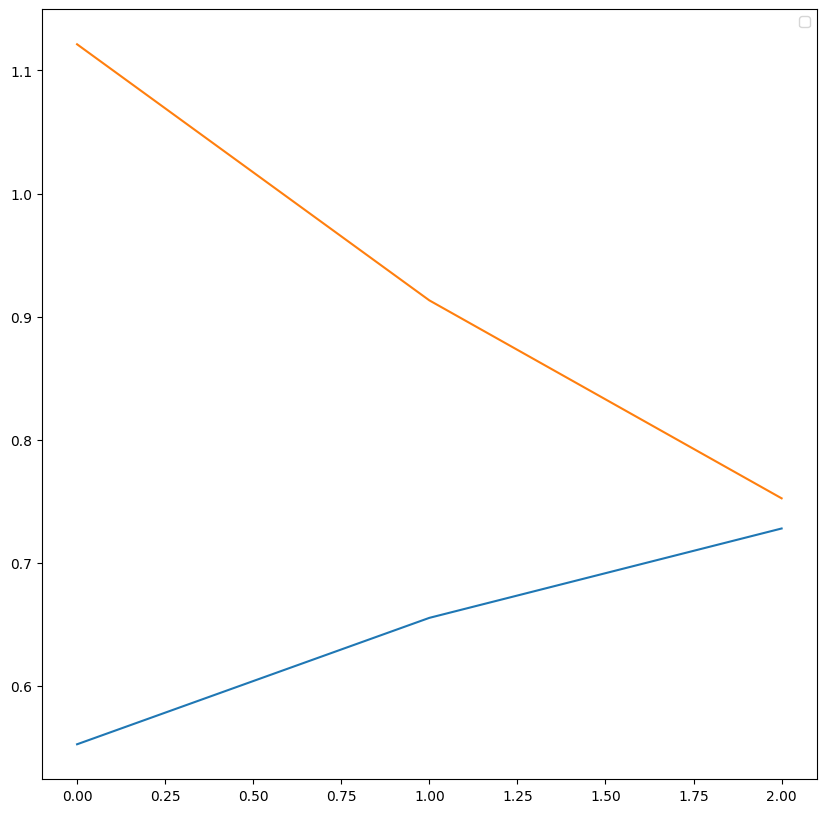

In [171]:
# Plot of loss and accuracy on training set
plt.figure(figsize = (10,10))
acc = history.history['accuracy']
loss = history.history['loss']

plt.plot(acc)
plt.plot(loss)
plt.legend(loc = 'upper right', handles = ['accuracy','loss'],labels= ['Blue','Yellow'])

In [176]:
new_model.evaluate(input_test,output_test)

32/32 [==============================] - 53s 2s/step - loss: 1.3559 - accuracy: 0.5505


[1.355873942375183, 0.5505397319793701]

In [177]:
categories = ['metal', 'glass', 'paper', 'trash', 'cardboard', 'plastic']
def convert_to_category(arr,categories):
    ans = []
    for k in arr:
        ans.append(categories[k])
    return ans

In [184]:
predicted_categories = np.argmax(model.predict(input_test), axis=1)
predicted_categories

32/32 [==============================] - 829s 26s/step


array([105, 105, 105, ..., 105, 105, 105])

In [192]:
# Wherever the val in the array is 1 return its index accordingly
original_test = output_test.argmax(1)
original_test

array([4, 2, 2, ..., 2, 2, 4])

In [224]:
#Import req. Lib.
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Convolution2D, MaxPooling2D, Flatten, Dense

#Save Model
model.save('Garbage.h5')

AttributeError: ignored

# New Section